# CIFAR-10 이미지 생성하기

- 일시: 2020.02.23

*****

## CIFAR 10으로 전에 없던 이미지를 만들자!

*****

## 전에 없던 데이터를 만드는 생성 모델링

||생성 모델링(Generative Modeling)|판별 모델링(Discriminative Modeling)|
|:---|:---|:---|
|**개념**|**학습한 데이터셋과 비슷하면서도 기존에는 없던 새로운 데이터 셋을 생성하는 모델**|**입력된 데이터셋을 특정 기준에 따라 분류하거나, 특정 값을 맞추는 모델**|

## 이미지 관련 다양한 생성 모델
### Pix2Pix 
**- 픽셀 단위로 한 이미지를 다른 이미지로 변환한다는 뜻.**    
**- 단순화된 Input Image와 실제 Ground Truth가 paired(쌍을 이루는) 데이터셋으로 학습을 진행.**   

|||
|:---||
|**단순한 이미지 입력 --> 내부연산 --> Predicted Image 출력(학습 초기에는 Ground Truth와 많이 다름) --> 계속 Ground Truth와 비교/평가 --> 점차 실제같은 결과물 출력**||


**- Input Image로는 구조적인 정보는 알 수 있지만 세부 디자인은 예측하기 어려움.    
 --> Predicted Image에는 구조적인 정보를 바탕으로 건물 이미지를 만들어    
 그에 어울리는 세부 디자인을 생성하여, Ground Truth와 비슷한 느낌을 줌.**

## CycleGAN
**- 이미지를 한 방향이 아닌 양방향으로 변환이 가능함. --> 실사 to 그림, 그림 to 실사**    
**- 모델이 스스로 얼룩말과 말에서 각각의 스타일을 합성해 새롱운 이미지에 그 스타일을 입힐 수 있도록 설계됨.     
 --> paired data가 필요 없으며, 라벨을 붙이는 주석(annotation)비용 절감 가능.**

## Neural Style Transfer
**- 딥러닝 기술로 이미지의 스타일을 변환시키는 기법.**     
**- 밑바탕으로 삼을 Base Image와 입히고 싶은 스타일을 가진 Style Image를 사용해 새로운 이미지를 생성.    
 --> Base Image에서는 Contect만, Style Image에서는 Style만 추출해서 합침.**


## GAN(Generative Adversarial Network, 생성적 적대 신경망)
**- 2014년 Ian Goodfellow라는 사람이 만든 생성 모델.**    
**- GAN에는 2가지 네트워크가 존재.**
> **- Generator(생성자): 아무 의미 없는 랜덤 노이즈로부터 신경망에서의 연산을 통해 이미지 형상의 벡터를 생성. 무에서 유를 창조.**    
> **- Discriminator(판별자): 기존에 있던 진짜 이미지와 생성자가 만들어낸 이미지를 입력받아 각 이미지가 진짜인지 가짜인지에 대한 판단 정도를 실수 값으로 표현.**   

> **<GAN의 문제점>**         
> **1. 단순한 이미지는 괜찮은 이미지를 생성하지만 복잡한 영상에서는 그닥 좋은 이미지를 생성하지 못함.**    
> **2. 학습 시에 안정성이 떨어짐.**

## DCGAN(Deep Convolution GAN)
**- Alec Radford 등이 2015년에 발표한 Convolution Layer으로 이루어진 딥러닝 모델.**  
**- GAN에 CNN을 적용하는 것 뿐만 아니라 아래 5가지 방법을 적용함.**

|||
|:--|:--|
|**Max-pooling layer를 삭제하고, strided convolution, fractonal-strided convolution을 사용하여 feature-map의 크기를 조절.**|
|**Batch nomarlization을 적용.**|
|**Fully connected hidden layer를 삭제.**|
|**Generator 모델의 출력층 활성함수로 tanh를 사용하고, 나머지 layer는 ReLU를 사용.**|
|**Discriminator의 활성함수로 LeakyPeLU를 사용.**|

**- 생성자 모델에서는 '균등 분포에서 추출한 100 개의 난수'를 입력으로 받고, 이미지 한 장을 출력함.**

*****

# Step 1. 작업환경 구성하기

In [1]:
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
from IPython.display import Image
import matplotlib.pyplot as plt
%matplotlib inline

print("tensorflow", tf.__version__)

tensorflow 2.2.0


```
$ mkdir -p ~/aiffel/dcgan_newimage/cifar10/generated_samples
$ mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_checkpoints
$ mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_history
```

*****

# Step 2. 데이터셋 구성하기

In [2]:
# cifar-10 데이터셋은 tf.keras.datasets에 포함되어 있음.  
cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data()

train_x.shape

(50000, 32, 32, 3)

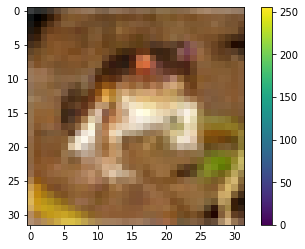

max pixel: 255
min pixel: 0


In [3]:
# 3차원 배열 형식, 아직 정규화되지 않음을 확인.
plt.figure
plt.imshow(train_x[0])
plt.colorbar()
plt.grid(False)
plt.show()

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

In [4]:
train_x[0]

array([[[ 59,  62,  63],
        [ 43,  46,  45],
        [ 50,  48,  43],
        ...,
        [158, 132, 108],
        [152, 125, 102],
        [148, 124, 103]],

       [[ 16,  20,  20],
        [  0,   0,   0],
        [ 18,   8,   0],
        ...,
        [123,  88,  55],
        [119,  83,  50],
        [122,  87,  57]],

       [[ 25,  24,  21],
        [ 16,   7,   0],
        [ 49,  27,   8],
        ...,
        [118,  84,  50],
        [120,  84,  50],
        [109,  73,  42]],

       ...,

       [[208, 170,  96],
        [201, 153,  34],
        [198, 161,  26],
        ...,
        [160, 133,  70],
        [ 56,  31,   7],
        [ 53,  34,  20]],

       [[180, 139,  96],
        [173, 123,  42],
        [186, 144,  30],
        ...,
        [184, 148,  94],
        [ 97,  62,  34],
        [ 83,  53,  34]],

       [[177, 144, 116],
        [168, 129,  94],
        [179, 142,  87],
        ...,
        [216, 184, 140],
        [151, 118,  84],
        [123,  92,  72]]

In [5]:
# train_x의 이미지를 [-1, 1]로 정규화.
train_x = (train_x - 127.5) / 127.5 # 이미지를 [-1, 1]로 정규화합니다.

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


In [6]:
train_x[0]

array([[[-0.5372549 , -0.51372549, -0.50588235],
        [-0.6627451 , -0.63921569, -0.64705882],
        [-0.60784314, -0.62352941, -0.6627451 ],
        ...,
        [ 0.23921569,  0.03529412, -0.15294118],
        [ 0.19215686, -0.01960784, -0.2       ],
        [ 0.16078431, -0.02745098, -0.19215686]],

       [[-0.8745098 , -0.84313725, -0.84313725],
        [-1.        , -1.        , -1.        ],
        [-0.85882353, -0.9372549 , -1.        ],
        ...,
        [-0.03529412, -0.30980392, -0.56862745],
        [-0.06666667, -0.34901961, -0.60784314],
        [-0.04313725, -0.31764706, -0.55294118]],

       [[-0.80392157, -0.81176471, -0.83529412],
        [-0.8745098 , -0.94509804, -1.        ],
        [-0.61568627, -0.78823529, -0.9372549 ],
        ...,
        [-0.0745098 , -0.34117647, -0.60784314],
        [-0.05882353, -0.34117647, -0.60784314],
        [-0.14509804, -0.42745098, -0.67058824]],

       ...,

       [[ 0.63137255,  0.33333333, -0.24705882],
        [ 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

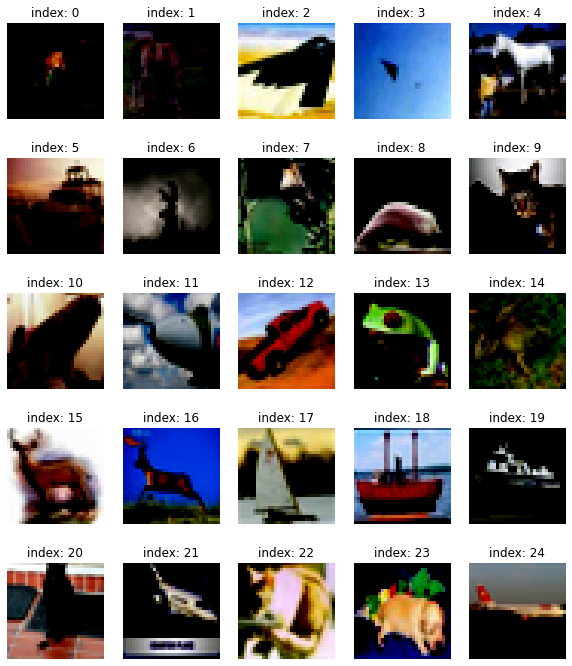

In [7]:
# 다운로드한 데이터 시각화하기.
plt.figure(figsize=(10, 12))

for i in range(25):
    plt.subplot(5, 5,  i+1)
    random_index = np.random.randint(1, 50000)
    plt.imshow(train_x[random_index].reshape(32, 32, 3))
    plt.title(f'index: {i}')
    plt.axis('off')

plt.show()

In [8]:
# 미니배치 데이터셋 구성하기.
# tf.data.Dataset 모듈의 fromtensorslices() 함수.
BUFFER_SIZE = 50000
BATCH_SIZE = 256

train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

*****

# Step 3. 생성자 모델 구현하기

In [9]:
# (32, 32, 3)의 shape를 가진 이미지를 생성하는 생성자 모델 구현 함수.

def make_generator_model(): # 생성자 생성.

    # 레이어 쌓기 시작.
    model = tf.keras.Sequential()

    # 1번 Dense layer
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # 2번 Reshape layer: 1차원 벡터를 3차원 벡터로 변환.
    model.add(layers.Reshape((8, 8, 256)))

    # 3번 Conv2DTranspose layer: Conv2D와 반대로 이미지 사이즈를 넓혀주는 층.
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization()) # 신경망 가중치가 폭발하지 않도록 가중치 값을 정규화.
    model.add(layers.LeakyReLU())

    # 4번 Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # 5번 Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model

In [10]:
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16384)             1638400   
_________________________________________________________________
batch_normalization (BatchNo (None, 16384)             65536     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 16384)             0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 128)         0

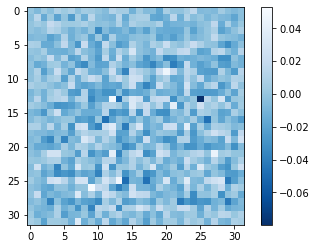

In [11]:
# 랜덤 노이즈를 입력하는 구현한 생성자로 랜덤 이미지를 생성.   
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap = 'Blues_r')
plt.colorbar()
plt.show()

In [12]:
# 생성된 랜덤 이미지가 생성자 출력 규격에 잘 맞는지 확인.
generated_image.shape

TensorShape([1, 32, 32, 3])

*****

# Step 4. 판별자 모델 구현하기

In [13]:
# (32, 32, 3)의 이미지를 입력으로 받아 1dim을 판별결과를 출력하는 판별자 모델 구현 함수.
def make_discriminator_model():

    # 레이어 쌓기 시작.
    model = tf.keras.Sequential()

    # 1번 Conv2D Layer: 이미지 크기를 점점 줄임.
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # 2번 Conv2D Layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # 3번 Flatten Layer: 3차원 이미지를 1차원 벡터로 변환.
    model.add(layers.Flatten())

    # 4번 Dense Layer: 하나의 값을 출력.
    model.add(layers.Dense(1))

    return model

In [14]:
discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 8192)             

In [15]:
# Step 2에서 생성한 랜덤 이미지를 판별자 모델이 판별한 결과값 확인.
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[-0.00120927]], shape=(1, 1), dtype=float32)


*****

# Step 5. 손실함수와 최적화 함수 구현하기

## 손실함수
**- GAN은 손실함수로 분류 모델에 많이 쓰는 '교차 엔트로피'를 사용.**    
 **--> 점점 가까워지길 원하는 두 값 사이에 얼마나 큰 차이가 나는지 정량적으로 계산할 때 많이 사용됨.**    
**- Discriminator는 이미지가 진짜인지 가짜인지 구별해야 함.**    
 **--> 2개 클래스 간 분류문제이기 때문에 '이진 교차 엔트로피'를 사용.**    
**- Real Image에 대한 라벨은 ```1```, Fake Image에 대한 라벨은 ```0```.**

> **<달성 목표>**    
> **- ```Generator```: ```Discriminator```가 Fake Image에 대해 판별한 ```D(fake_image)```값이 1에 가까워지는 것.**    
> **- ```Discriminator```: Real Image의 판별값인 ```D(real_image)```는 1에, Fake Image의 판별값인 ```D(fake_image)```는 0에 가까워지는 것.**

> **<이진 교차 엔트로피로 계산할 loss들>**    
> **- ```fake_output``` : Generator가 생성한 Fake Image를 Discriminator에 입력시켜서 판별된 값. --> ```D(fake_image)```**    
> **- ```real_output``` : 기존에 있던 Real Image를 Discriminator에 입력시켜서 판별된 값. --> ```D(real_image)```**    

In [16]:
# 생성자의 손실함수 구현.
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [17]:
# 판별자의 손실함수 구현.
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [18]:
# 판별자의 출력값을 가지고 실제/생성 이미지 판별 정확도(accuracy)를 계산하는 함수.
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

## 최적화 함수
- **Adam을 사용.** 

In [19]:
# 생성자와 판별자는 개별 네트워크임으로 최적화 함수를 따로 만들어줌.
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [20]:
# 학습의 진행 확인을 위한 생성자 생성 샘플 확인.
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

*****

# Step 6. 훈련과정 상세 기능 구현하기

## 모델 설계

In [21]:
# 1개 미니배치의 훈련 과정을 처리하는 train_step() 함수를 구현.
@tf.function
def train_step(images):  #(1) 입력데이터.
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈.

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈.
        generated_images = generator(noise, training=True)  #(4) generated_images 생성.

        #(5) discriminator 판별.
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산.
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산.
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산.
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습.
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값.

In [22]:
# 16개의 고정된 seed를 입력으로 하여 훈련 과정 동안 
# 생성한 이미지를 시각화하는 generate_and_save_images() 함수 구현.    
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(predictions[i, :, :, 0], cmap = 'Blues_r')
        plt.axis('off')

    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))

    plt.show()

In [23]:
# 훈련 epoch마다 생성자/판별자의 loss 및 판별자의 실제/생성 이미지 
# 판별 accuracy히스토리를 그래프로 시각화하는 draw_train_history() 함수. 
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6 # matlab 차트의 기본 크기를 15,6으로 지정.

def draw_train_history(history, epoch):
    # loss 히스토리.  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # accuracy 히스토리. 
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장.
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

In [24]:
# training_checkpoints 디렉토리에 몇 epoch마다 모델을 저장하는 checkpoint 모듈 설정.
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

*****

# Step 7. 학습 과정 진행하기

In [25]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

In [26]:
save_every = 5
EPOCHS = 500

# 사용가능한 GPU 디바이스 확인.
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

- **checkpoint를 통해 모델이 로드되었다면 아래코드로 로드된 모델의 파라미터 상태에서 훈련 재개 가능.**

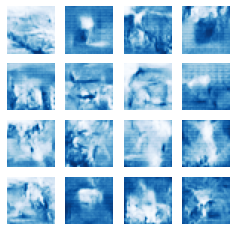

Time for training : 5854 sec


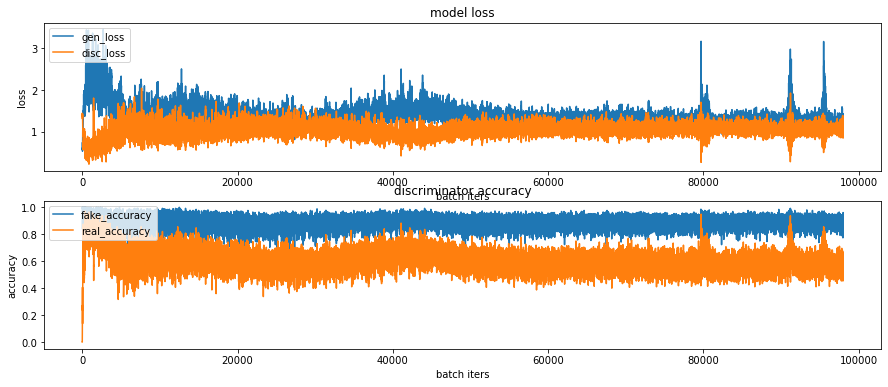

CPU times: user 1h 37min 49s, sys: 3min 29s, total: 1h 41min 18s
Wall time: 1h 37min 37s


In [27]:
%%time
train(train_dataset, EPOCHS, save_every)

# 학습과정의 loss, accuracy 그래프 이미지 파일이 
#~/aiffel/dcgan_newimage/fashion/training_history 경로에 생성되고 있음.
# 진행 과정을 수시로 확인 권장.

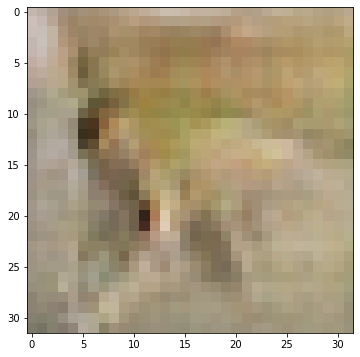

In [42]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것.

## 학습진행과정 시각화하기(이미지 샘플 gif, 학습 진행 그래프 gif)

In [47]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif

-rw-r--r-- 1 aiffel-dj20 aiffel-dj20 4231328  3월  1 18:32 /home/aiffel-dj20/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif


In [50]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_train_graphs.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/training_history/train*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_train_graphs.gif

-rw-r--r-- 1 aiffel-dj20 aiffel-dj20 4294532  3월  1 18:35 /home/aiffel-dj20/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_train_graphs.gif


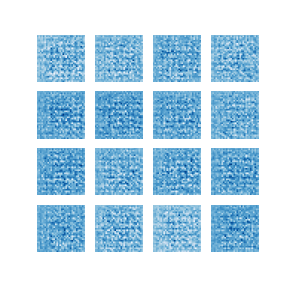

In [55]:
import IPython
from IPython.display import Image
Image(filename='/home/aiffel-dj20/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif')

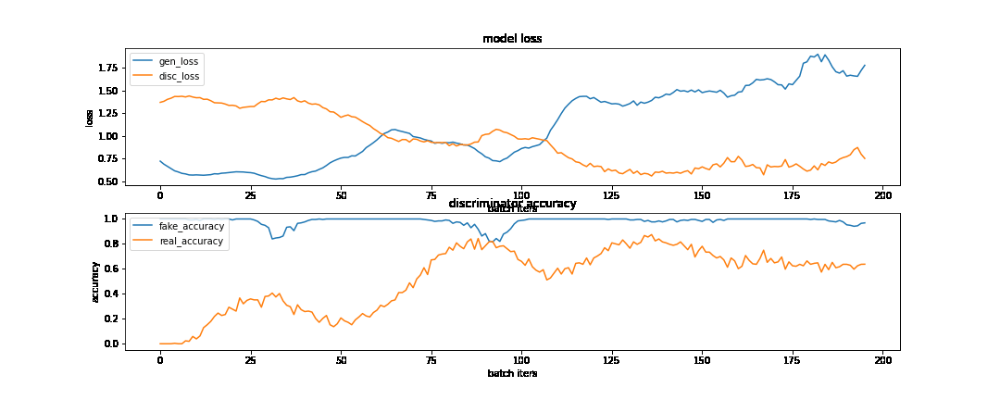

In [56]:
Image(filename='/home/aiffel-dj20/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_train_graphs.gif')

*****

# Step 7. (optional) GAN 훈련 과정 개선하기

## 문제점 분석하기

**1. 이미지 생성이 제대로 되었는지 여부.**    
**주피터 노트북에는 1시간 30분 정도 훈련을 시킨 것으로 나올 것이다. 하지만 실제로는 초기화시켜서 계속 돌렸기에 실 훈련 시간은 5시간이 넘는다. 하지만 훈련을 시킨 시간 대비 결과물이 깔끔하지 못하다. 패션만들기를 할 때는 50번 정도 돌리면 물체의 형태가 나오던데, CIFAR 10은 보다 피사체가 자유분방해서 그런지 제대로 결과물이 나오지 않았다. 나는 하도 돌리니까 뭔가 나온것 같아보이기도 한다. 이미지 생성을 확인하는 부분에 나오는 이미지가 뭔가 새끼 사슴을 닮지 않았는가?**     

**2. fake accuracy가 1.0에 더 가까움**
**real accuracy와 fake accuracy는 초반에는 1.0에 가깝게 나오다가, 서서히 낮아져서 둘 다 0.5에 가까워지는 것이 이상적이라고 한다. 그리고 fake accuracy가 0.1에 더 가깝다면 아직은 생성자가 판별자를 충분히 속이지 못하는 것이라고 한다. 나의 모델은 fake accuracy가 계속 1.0에 머물러있어 생성자가 판별자를 충분히 속이지 못함을 보여주고 있다.**

## 개선하기

**개선까지는 너무 힘들어서 생략하겠다. 한번 GAN을 돌려봤다는 것에 의의를 두려고 한다.**

****

# 루브릭 평가

|평가문항|상세기준|
|:----|:----|
|1. GAN의 두 모델 구조를 통해 이미지를 성공적으로 생성하였다.|오브젝트 종류를 육안으로 구별할 수 있을 만한 이미지를 생성하였다.|
|2. 생성 이미지 시각화 및 학습 그래프를 통해 GAN 학습이 바르게 진행되었음을 입증하였다.|gif를 통해 생성이미지 품질이 서서히 향상되는 것과, fake accuracy가 추세적으로 0.5를 향해 하향하고 있음을 확인하였다.|
|3. 추가적인 GAN 모델구조 혹은 학습과정 개선 아이디어를 제안하고 이를 적용하였다.|제출 아이디어를 제출 프로젝트에 반영하고, 그 결과가 아이디어 적용 이전보다 향상되었음을 시각적으로 입증하였다.|

**1. 생성자와 판별자 모델은 성공적으로 만든 것 같다. 다만 육안으로 구별할만한 이미지는 잘 만들지 못한 것 같다. 육안으로 이게 어떤 동물인지, 물체인지 구분할 수 있다기 보다는 어떤 것의 윤곽이 조금 보인다고 할 수 있을 것 같다.**    

**2. 이미지 시각화 및 학습 그래프는 구현했다. 하지마 제대로 학습하지는 못한 것 같다. fake accuracy가 1.0에 가깝고 0.5에 도달하지 못했기 때문이다.**    

**3. 문제점은 파악했으나 학습과정 개선을 힘들어서 생략했다. 다른 분들의 개선 방안을 보고 나중에 적용해봐야겠다.**

# 회고

**엄청 신기하지만 또 엄청 어려운 프로젝트였다. 실 훈련 시간만 5시간이 넘는데, 모델이 잘 못된 것인지 5시간은 너무 짧았던 것인지 바라던 결과물이 나오지 않아서 속상했다. 그래도 1시간 30분을 연속으로 돌리면 물체의 윤곽 비스므리한 것이 나오긴 했다. 실제 생물, 물체인지는 잘 모르겠으나 뭔가 포켓몬 윤곽정도를 만든 기분이 든다.**    

**개선점을 찾으라고 하는데 노드에 있는 참고 문헌을 보고 어떻게 적용해야 할지 몰라서 우선 GAN을 한번 돌려봤다는 것에 의의를 둔다. 다른 분들이 어떻게 학습시키고 개선시켰는지 얼른 보고 싶다.**   

**가끔 NLP반을 선택한 것이 성급한 결정은 아니었나 하는 생각이 드는데, GAN을 돌려보니 역시 CV가 나한텐 더 어려운 것 같다.**